[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/azad-academy/denoising-diffusion-model/blob/main/diffusion_model_demo.ipynb)

# Diffusion Models Tutorial



# Loading Data

shape of moons: (10000, 2)


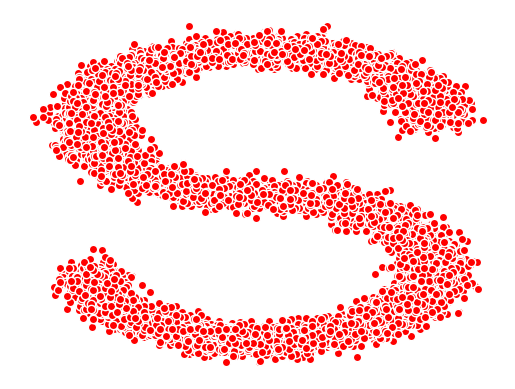

In [33]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_s_curve
import torch
s_curve, _= make_s_curve(10**4, noise=0.1)
s_curve = s_curve[:, [0, 2]]/10.0
print("shape of moons:",np.shape(s_curve))
data = s_curve.T
fig,ax = plt.subplots()
ax.scatter(*data,color='red',edgecolor='white');
ax.axis('off')
dataset = torch.Tensor(s_curve).float()

## Diffusion Models

![diffusion-image](https://github.com/azad-academy/denoising-diffusion-model/blob/main/images/diffusion.png?raw=1)

## Forward Diffusion

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{1-\beta_{t}}\mathbf{x}_{t-1},\beta_{t}\mathbf{I})
$$

Substituting $\alpha_{t}=1-\beta_{t}$ and $\bar{\alpha}_{t} = \prod_{s=1}^{t} \alpha_{s}$:

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{0}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{\bar{\alpha}_{t}}\mathbf{x}_{t-1},(1-\bar{\alpha}_{t})\mathbf{I})
$$

Given the initial state, this makes it possible to draw sample at any desrired timestep without going through intermediate steps. Forward diffusion can also be written in terms of $x_0$ and the random noise $\epsilon \sim \mathcal{N}(0,1)$ [1]. This would be useful when performing denoising step later in the reverse diffusion.

$$
x_t(x_0,\epsilon) = \sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1-\bar{\alpha_{t}}}\epsilon          
$$

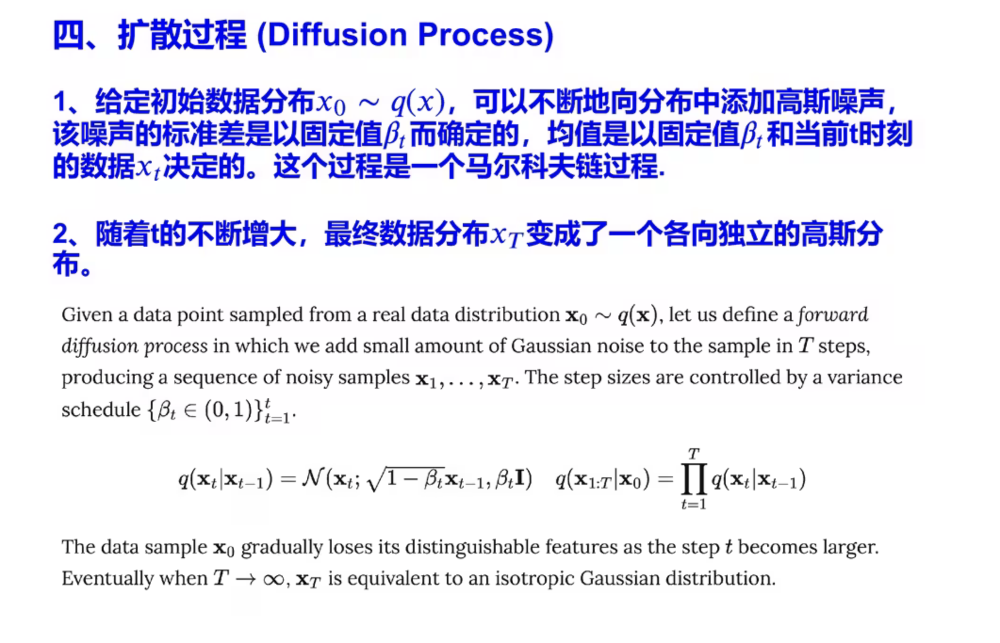
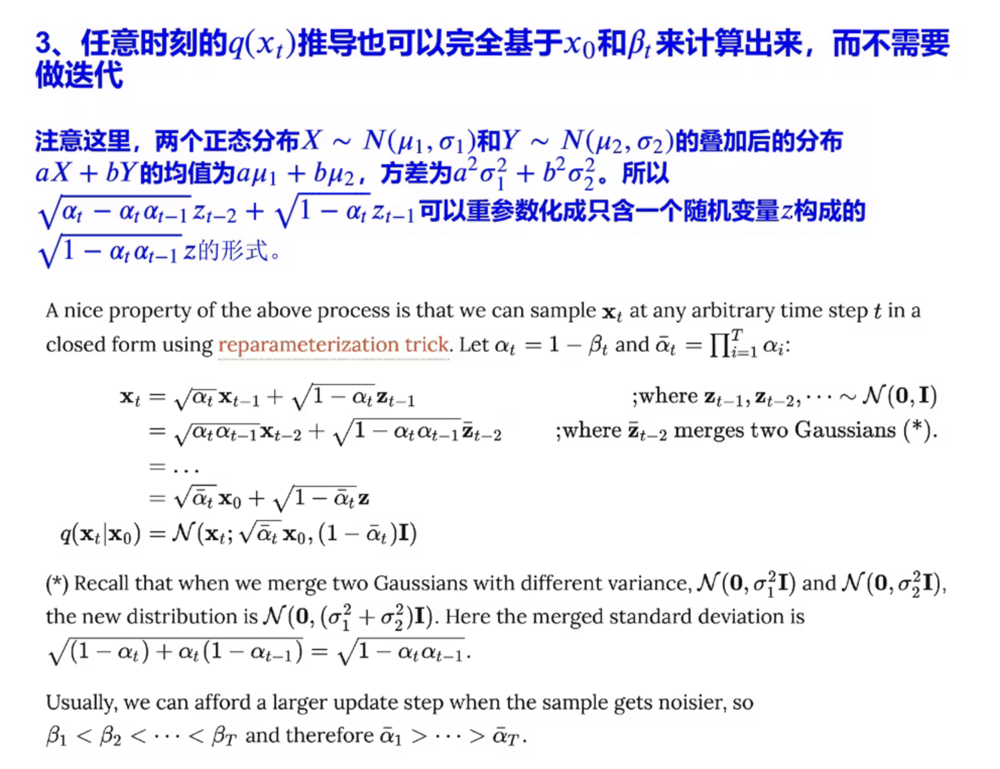

# Hyperparameters

In [42]:
# 超参数设置，参考上图
num_steps = 100
betas = torch.linspace(-6,6,num_steps)
betas = torch.sigmoid(betas) * (0.02 - 1e-4) + 1e-4
alphas = 1 - betas
alphas_prod = torch.cumprod(alphas, 0)
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[:-1]], 0)
alphas_bar_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_bar_log = torch.log(1 - alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)
assert alphas.shape==alphas_prod.shape==alphas_prod_p.shape==alphas_bar_sqrt.shape==one_minus_alphas_bar_log.shape==one_minus_alphas_bar_sqrt.shape
print("all the same shape:",betas.shape)

all the same shape: torch.Size([100])


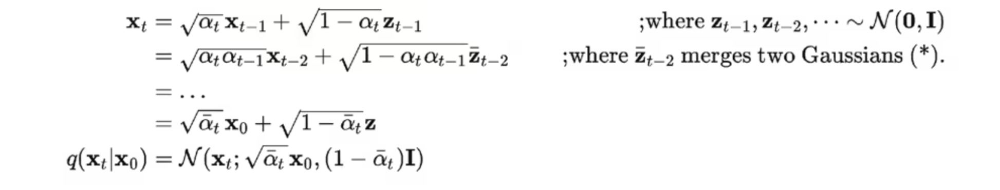

# Sample Xt from every timestamp

In [40]:
#通过参数重整化技巧，生成任意时刻x的采样值
def q_x(x_0, t):
    #正态分布的噪声
    noise = torch.randn_like(x_0)
    #均值
    alphas_t = alphas_bar_sqrt[t]
    #方差
    alphas_1_m_t = one_minus_alphas_bar_sqrt[t]
    return (alphas_t * x_0 + alphas_1_m_t * noise)

# Forward Diffusion

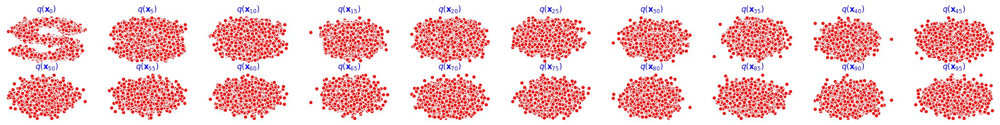

In [41]:
num_shows=20
fig, axs = plt.subplots(2, 10, figsize=(28, 3))
plt.rc('text',color='blue')
for i in range(num_shows):
    j=i//10
    k=i%10
    q_i = q_x(dataset, torch.tensor([i * num_steps//num_shows]))
    axs[j, k].scatter(q_i[:, 0], q_i[:, 1],color='red',edgecolor='white')
    axs[j, k].set_axis_off()
    axs[j, k].set_title('$q(\mathbf{x}_{'+str(i * num_steps//num_shows)+'})$')

In [ ]:
posterior_mean_coef_1 = (betas * torch.sqrt(alphas_prod_p) / (1 - alphas_prod))
posterior_mean_coef_2 = ((1 - alphas_prod_p) * torch.sqrt(alphas) / (1 - alphas_prod))
posterior_variance = betas * (1 - alphas_prod_p) / (1 - alphas_prod)
posterior_log_variance_clipped = torch.log(torch.cat((posterior_variance[1].view(1, 1), posterior_variance[1:].view(-1, 1)), 0)).view(-1)

def q_posterior_mean_variance(x_0, x_t, t):
    coef_1 = extract(posterior_mean_coef_1, t, x_0)
    coef_2 = extract(posterior_mean_coef_2, t, x_0)
    mean = coef_1 * x_0 + coef_2 * x_t
    var = extract(posterior_log_variance_clipped, t, x_0)
    return mean, var

# Reverse Diffusion Model

Unlike the forward diffusion, the reverse diffusion process requires training of a neural network model. We setup the necessary loss functions and training parameters and then perform the training.
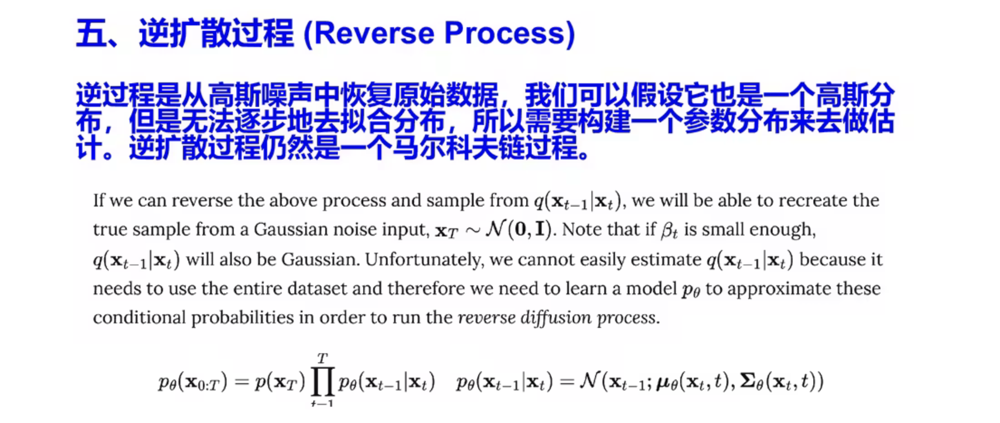
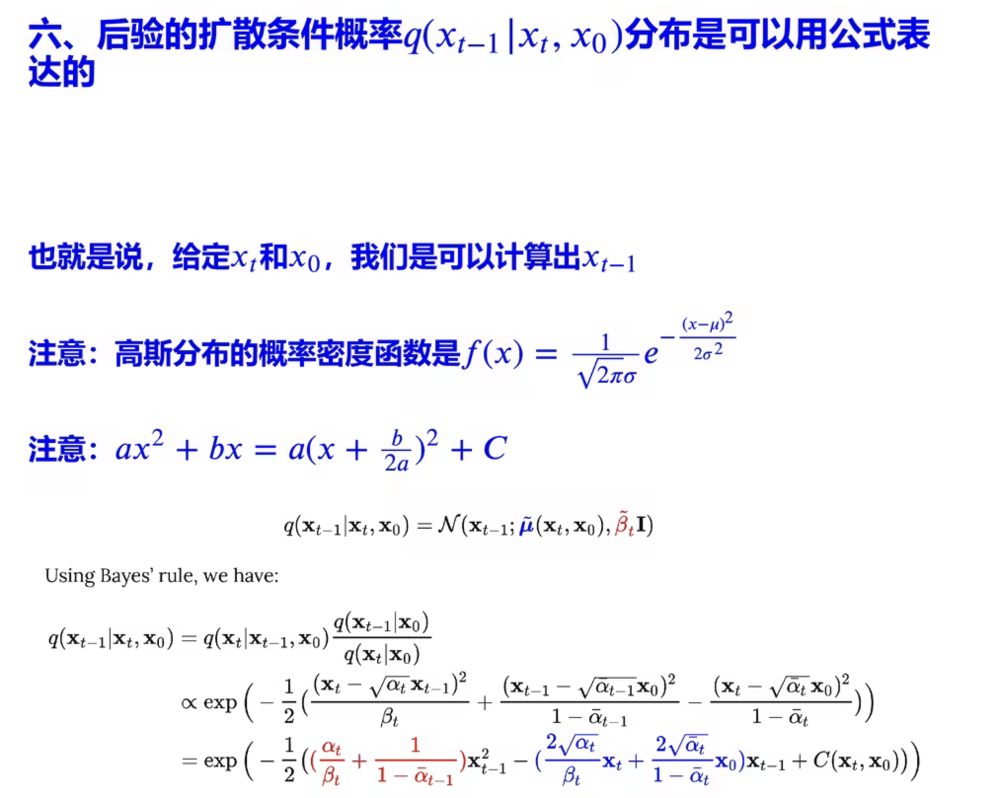
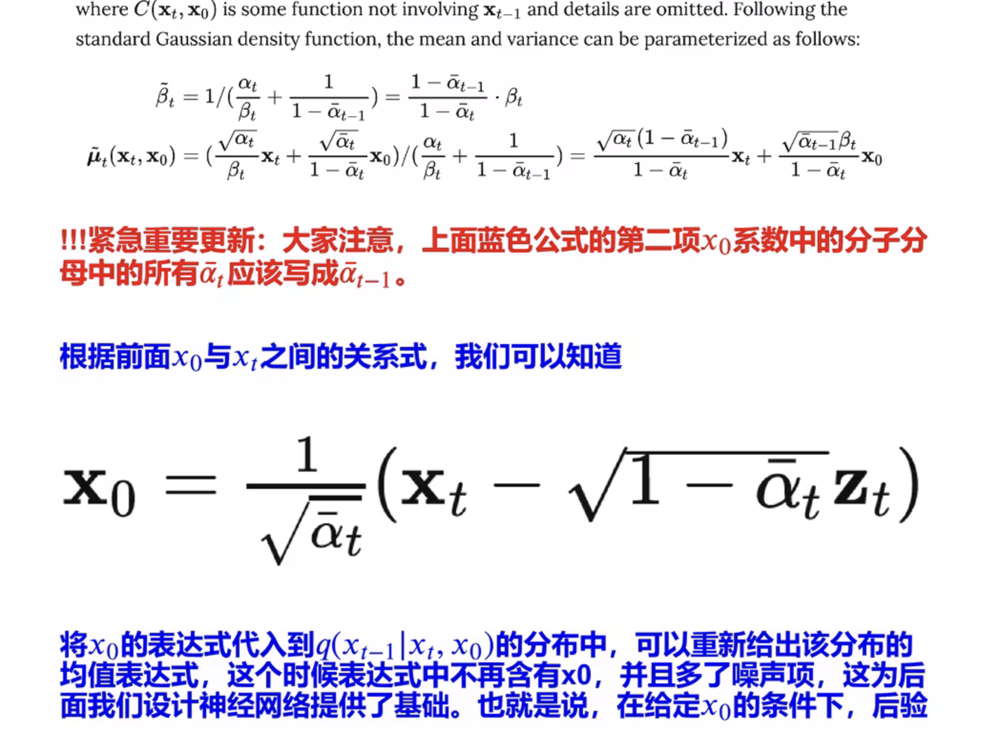
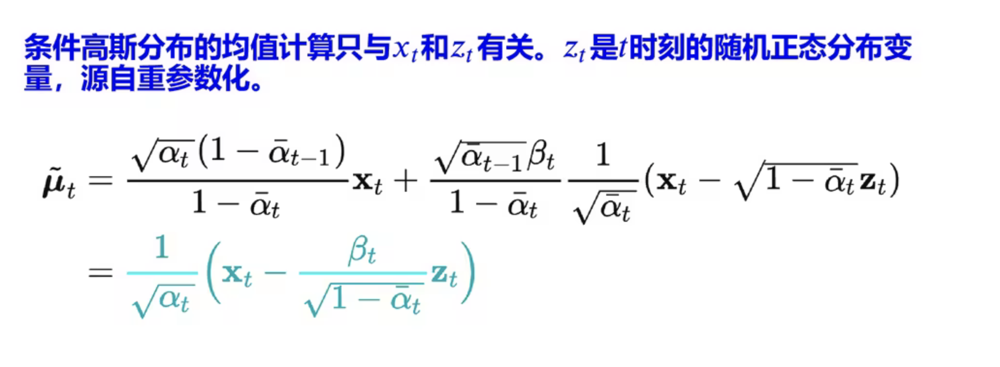

In [44]:
import torch
import torch.nn as nn

class MLPDiffusion(nn.Module):
    def __init__(self,n_steps,num_units=128):
        super(MLPDiffusion,self).__init__()
        
        self.linears = nn.ModuleList(
            [
                nn.Linear(2,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,2),
            ]
        )
        self.step_embeddings = nn.ModuleList(
            [
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
            ]
        )
    def forward(self,x,t):
#         x = x_0
        for idx,embedding_layer in enumerate(self.step_embeddings):
            t_embedding = embedding_layer(t)
            x = self.linears[2*idx](x)
            x += t_embedding
            x = self.linears[2*idx+1](x)
            
        x = self.linears[-1](x)
        
        return x

In [50]:
from torchinfo import summary

# 假设参数
n_steps = 100
batch_size = 128


model = MLPDiffusion(n_steps)

# 准备模拟输入
# x: (batch_size, 2)
# t: (batch_size,) 必须是 torch.long 类型，因为要输入 nn.Embedding
x_input = torch.randn(batch_size, 2)
t_input = torch.randint(0, n_steps, (batch_size,), dtype=torch.long)

# 进行 Summary
summary(
    model, 
    input_data=[x_input, t_input],
    # 显式添加 "input_size" 到列表中
    col_names=["input_size", "output_size", "num_params", "mult_adds"], 
    depth=4 # 设置深度可以看到更子层的输入输出
)

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Mult-Adds
MLPDiffusion                             [128, 2]                  [128, 2]                  --                        --
├─ModuleList: 1-5                        --                        --                        (recursive)               --
│    └─Embedding: 2-1                    [128]                     [128, 128]                12,800                    1,638,400
├─ModuleList: 1-6                        --                        --                        (recursive)               --
│    └─Linear: 2-2                       [128, 2]                  [128, 128]                384                       49,152
│    └─ReLU: 2-3                         [128, 128]                [128, 128]                --                        --
├─ModuleList: 1-5                        --                        --                        (recursive)               --
│    └

# Training Loss

## Training Loss

The original loss was proposed in Sohl-Dickstein et al. [1] as following:

\begin{align}
K = -\mathbb{E}_{q}[ &D_{KL}(q(\mathbf{x}_{t-1}\mid\mathbf{x}_{t},\mathbf{x}_{0}) \Vert p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t}))  \\
&+ H_{q}(\mathbf{X}_{T}\vert\mathbf{X}_{0}) - H_{q}(\mathbf{X}_{1}\vert\mathbf{X}_{0}) - H_{p}(\mathbf{X}_{T})]
\end{align}


In order to improve the results, the authors in Ho et al. [2] proposed multiple improvements. Following Parameterization of mean is proposed:

$$
\mathbf{\mu}_{\theta}(\mathbf{x}_{t}, t) = \frac{1}{\sqrt{\alpha_{t}}} \left( (\mathbf{x}_{t} - \frac{\beta_{t}}{\sqrt{1 - \bar{\alpha}}_{t}} \mathbf{\epsilon}_{\theta} (\mathbf{x}_{t}, t) \right)
$$

further, variance is taken as constant and the step for reverse diffusion then becomes:

$$
\mathbf{x}_{t-1} = \frac{1}{\sqrt{\alpha_{t}}} \left( \mathbf{x}_{t} - \frac{1-\alpha_{t}}{\sqrt{1-\bar{\alpha_{t}}}} \mathbf{\epsilon}_{\theta}(\mathbf{x}_{t}, t) \right) + \sigma_{t}\mathbf{z}
$$



After further improvements and simplifications the loss function becomes:

$$
\mathcal{L}_{\text{simple}}=\mathbb{E}_{t, \mathbf{x}_{0},\mathbf{\epsilon}}\left[ \Vert \epsilon - \epsilon_{\theta}(\sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1 - \bar{\alpha}_{t}}\mathbf{\epsilon}, t) \Vert^{2} \right].
$$

In [45]:
def diffusion_loss_fn(model,x_0,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,n_steps):
    """对任意时刻t进行采样计算loss"""
    # label是每个时间步t加入的噪声，预测值是每个时间步预测的噪声
    # 采样随机的时间步，计算损失
    batch_size = x_0.shape[0]
    
    #对一个batchsize样本生成随机的时刻t
    t = torch.randint(0,n_steps,size=(batch_size//2,))
    t = torch.cat([t,n_steps-1-t],dim=0)
    t = t.unsqueeze(-1)
    
    #x0的系数
    a = alphas_bar_sqrt[t]
    
    #eps的系数
    aml = one_minus_alphas_bar_sqrt[t]
    
    #生成随机噪音eps
    e = torch.randn_like(x_0)
    
    #构造模型的输入
    x = x_0*a+e*aml
    
    #送入模型，得到t时刻的随机噪声预测值
    output = model(x,t.squeeze(-1))
    
    #与真实噪声一起计算误差，求平均值
    return (e - output).square().mean()

# Inference
![[tmp-934.png]]

In [46]:
def p_sample_loop(model,shape,n_steps,betas,one_minus_alphas_bar_sqrt):
    """从x[T]恢复x[T-1]、x[T-2]|...x[0]"""
    cur_x = torch.randn(shape)
    x_seq = [cur_x]
    for i in reversed(range(n_steps)):
        cur_x = p_sample(model,cur_x,i,betas,one_minus_alphas_bar_sqrt)
        x_seq.append(cur_x)
    return x_seq

def p_sample(model,x,t,betas,one_minus_alphas_bar_sqrt):
    """从x[T]采样t时刻的重构值"""
    t = torch.tensor([t])
    
    coeff = betas[t] / one_minus_alphas_bar_sqrt[t]
    
    eps_theta = model(x,t)
    
    mean = (1/(1-betas[t]).sqrt())*(x-(coeff*eps_theta))
    
    z = torch.randn_like(x)
    sigma_t = betas[t].sqrt()
    
    sample = mean + sigma_t * z
    
    return (sample)

# Train

Training model...
tensor(0.2984, grad_fn=<MeanBackward0>)
tensor(0.2469, grad_fn=<MeanBackward0>)
tensor(0.1258, grad_fn=<MeanBackward0>)
tensor(0.1795, grad_fn=<MeanBackward0>)
tensor(0.2895, grad_fn=<MeanBackward0>)
tensor(0.2660, grad_fn=<MeanBackward0>)
tensor(0.2610, grad_fn=<MeanBackward0>)
tensor(0.2560, grad_fn=<MeanBackward0>)
tensor(0.1759, grad_fn=<MeanBackward0>)
tensor(0.1343, grad_fn=<MeanBackward0>)
tensor(0.3904, grad_fn=<MeanBackward0>)
tensor(0.2666, grad_fn=<MeanBackward0>)
tensor(0.1254, grad_fn=<MeanBackward0>)
tensor(0.0839, grad_fn=<MeanBackward0>)
tensor(0.1569, grad_fn=<MeanBackward0>)
tensor(0.1317, grad_fn=<MeanBackward0>)
tensor(0.1258, grad_fn=<MeanBackward0>)
tensor(0.2524, grad_fn=<MeanBackward0>)
tensor(0.1664, grad_fn=<MeanBackward0>)
tensor(0.2967, grad_fn=<MeanBackward0>)
tensor(0.1333, grad_fn=<MeanBackward0>)


/tmp/ipykernel_5048/2415299030.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(1,10,figsize=(28,3))


tensor(0.1704, grad_fn=<MeanBackward0>)
tensor(0.3116, grad_fn=<MeanBackward0>)
tensor(0.2409, grad_fn=<MeanBackward0>)
tensor(0.0910, grad_fn=<MeanBackward0>)
tensor(0.1051, grad_fn=<MeanBackward0>)
tensor(0.1298, grad_fn=<MeanBackward0>)
tensor(0.1325, grad_fn=<MeanBackward0>)
tensor(0.0693, grad_fn=<MeanBackward0>)
tensor(0.0728, grad_fn=<MeanBackward0>)
tensor(0.2825, grad_fn=<MeanBackward0>)
tensor(0.1152, grad_fn=<MeanBackward0>)
tensor(0.2383, grad_fn=<MeanBackward0>)
tensor(0.4631, grad_fn=<MeanBackward0>)
tensor(0.1958, grad_fn=<MeanBackward0>)
tensor(0.1803, grad_fn=<MeanBackward0>)
tensor(0.1710, grad_fn=<MeanBackward0>)
tensor(0.1388, grad_fn=<MeanBackward0>)
tensor(0.1528, grad_fn=<MeanBackward0>)
tensor(0.1850, grad_fn=<MeanBackward0>)


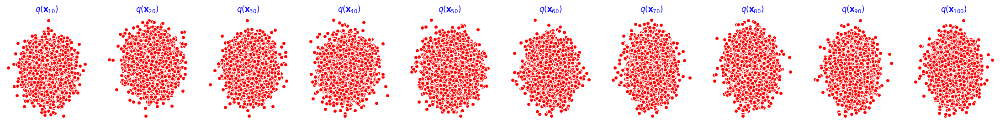

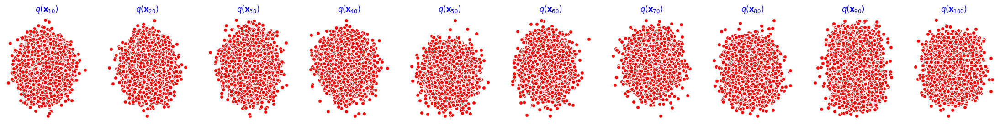

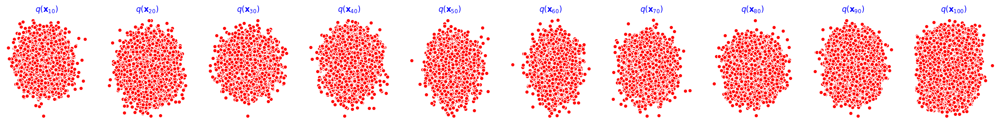

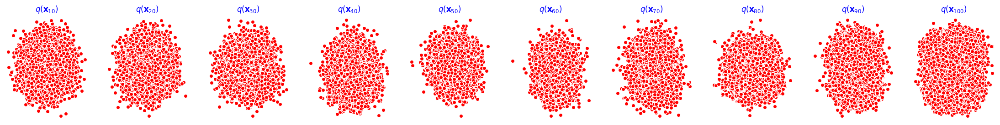

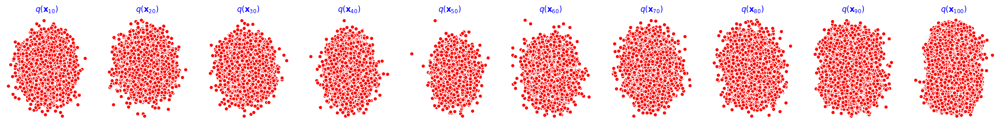

...

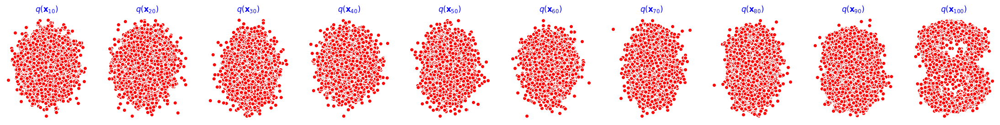

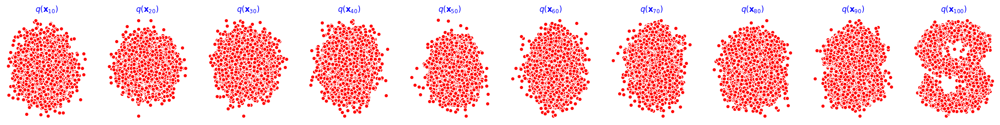

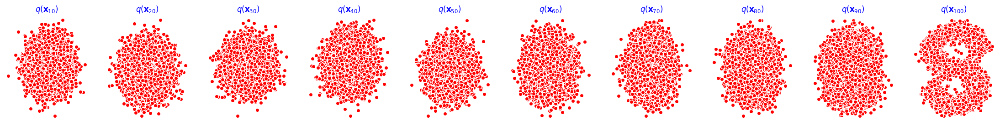

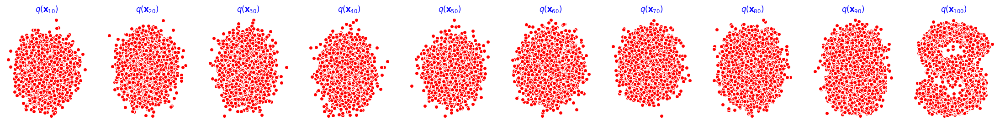

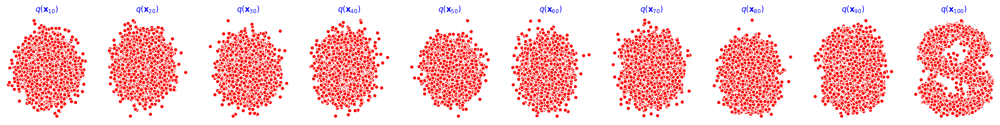

In [47]:
seed = 1234

class EMA():
    """构建一个参数平滑器"""
    def __init__(self,mu=0.01):
        self.mu = mu
        self.shadow = {}
        
    def register(self,name,val):
        self.shadow[name] = val.clone()
        
    def __call__(self,name,x):
        assert name in self.shadow
        new_average = self.mu * x + (1.0-self.mu)*self.shadow[name]
        self.shadow[name] = new_average.clone()
        return new_average
    
print('Training model...')
# 采样的点是2D坐标
batch_size = 128
dataloader = torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True)
num_epoch = 4000
plt.rc('text',color='blue')

model = MLPDiffusion(num_steps)#输出维度是2，输入是x和step
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)

for t in range(num_epoch):
    for idx,batch_x in enumerate(dataloader):
        loss = diffusion_loss_fn(model,batch_x,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,num_steps)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(),1.)
        optimizer.step()
        
    if(t%100==0):
        print(loss)
        x_seq = p_sample_loop(model,dataset.shape,num_steps,betas,one_minus_alphas_bar_sqrt)
        
        fig,axs = plt.subplots(1,10,figsize=(28,3))
        for i in range(1,11):
            cur_x = x_seq[i*10].detach()
            axs[i-1].scatter(cur_x[:,0],cur_x[:,1],color='red',edgecolor='white');
            axs[i-1].set_axis_off();
            axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*10)+'})$')

# Animation

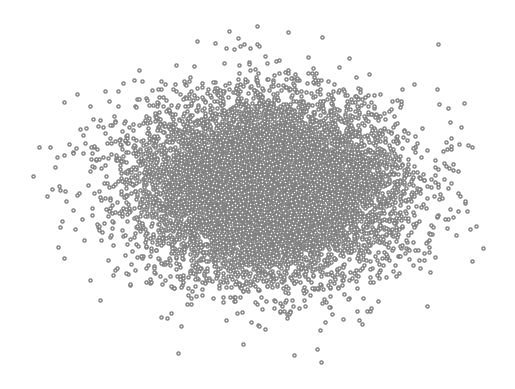

In [51]:
# Generating the forward image sequence

import io
from PIL import Image

imgs = []
#fig, axs = plt.subplots(1, 10, figsize=(28, 3))
for i in range(100):
    plt.clf()
    q_i = q_x(dataset, torch.tensor([i]))
    plt.scatter(q_i[:, 0], q_i[:, 1],color='white',edgecolor='gray', s=5);
    plt.axis('off');

    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    imgs.append(img)


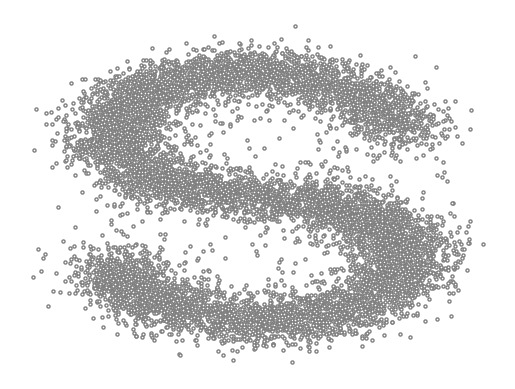

In [52]:
# Generating the reverse diffusion sequence

reverse = []
for i in range(100):
    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:, 0], cur_x[:, 1],color='white',edgecolor='gray', s=5);
    plt.axis('off')

    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    reverse.append(img)

In [53]:
imgs = imgs + reverse

In [54]:
imgs[0].save("diffusion.gif", format='GIF', append_images=imgs,save_all=True, duration=100, loop=0)

# References

[1] Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models. arXiv preprint arXiv:2006.11239.

[2] Sohl-Dickstein, J., Weiss, E. A., Maheswaranathan, N., & Ganguli, S. (2015). Deep unsupervised learning using nonequilibrium thermodynamics. arXiv preprint arXiv:1503.03585.